# UCCD 3074 Deep Learning for Data Science

### **Topic: Fingerspelling – A Sign Language Recognition**

### Member Details:

|Details |Student 1|Student 2|Student 3|
| --- | --- | --- | --- |
|Name |Tan Jing Jie | Ng Jan Hui | Sia Ken Yen |
|Student ID |18ACB04560 | 18ACB02347| 18ACB04562 |
|Pracical Group| P6| P6 | P6|

# Part 1: Environment setup


Mount Notebook to Google Colab Drive

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [3]:
# Jing Jie path
data_path = '/content/drive/MyDrive/UCCD3074_Labs/Assignment_2/extracted'
model_path = '/content/drive/MyDrive/UCCD3074_Labs/Assignment_2'

# Sean and sky path
# data_path = '/content/drive/MyDrive/Colab Notebooks/extracted' 

Load Libraries

In [4]:
import os
import math
import time
import matplotlib
import numpy as np
import pandas as pd
import torch.nn as nn
import seaborn as sns
import torch, torchvision
import torch.optim as optim
import matplotlib.pyplot as plt
import torch.nn.functional as F
import torchvision.models as models
import torch.utils.data as data_utils

from PIL import Image, ImageOps
from collections import Counter
from torchsummary import summary
from torch.nn.modules.activation import ReLU
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, datasets, models, utils
from sklearn.metrics import classification_report, ConfusionMatrixDisplay, confusion_matrix

# Part 2: Dataset Preparation

## 2.1 DataSet Extraction



```
############################
# Coded by Tan Jing Jie
############################
Please refer to extract.ipynb for data set reduction extraction
```



## 2.2 Transformation Pipeline

For VGGNet, RestNet, EfficientNet, ShallowNet

In [16]:
############################
# Coded by Sia Ken Yen
############################
data_transform = transforms.Compose([transforms.Resize(224), 
                                      transforms.ToTensor(),
                                      transforms.Normalize((0.5, 0.5, 0.5), (1., 1., 1.))
                                     ])
data = datasets.ImageFolder(data_path, transform=data_transform)

For Grayscale + Custom Net

In [5]:
############################
# Coded by Tan Jing Jie
############################
data_transform2 = transforms.Compose([transforms.Resize(224), 
                                      transforms.ToTensor(),
                                      transforms.Grayscale(num_output_channels=1),
                                      transforms.Normalize((0.5), (1.))
                                     ])
data2 = datasets.ImageFolder(data_path, transform=data_transform2)

## 2.3 Dataset Exploration
```
############################
# Coded by Tan Jing Jie
############################
```



Number of images:  3625
label:  0


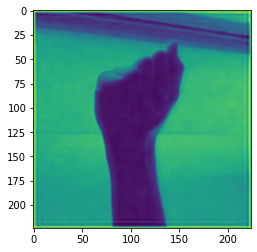

In [ ]:
print('Number of images: ', len(data))
image, label = data[0]
print("label: ", label)
plt.imshow(image[2])

In [ ]:
num_classes = len(dict(Counter(data.targets)))
print(f'Total of classes in the dataset: {num_classes}')

Total of classes in the dataset: 29


In [ ]:
print("Dataset classes: ", data.classes)

Dataset classes:  ['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J', 'K', 'L', 'M', 'N', 'O', 'P', 'Q', 'R', 'S', 'T', 'U', 'V', 'W', 'X', 'Y', 'Z', 'del', 'nothing', 'space']


## 2.4 Train Validation Test Split

In [17]:
############################
# Coded by Ng Jan Hui
############################

# Splitting data to 3 sets
train_set, validation_set, test_set = torch.utils.data.random_split(data, [2900, 363, 362])

# Creating dataloaders for each set, with batch_size = 16
trainloader = DataLoader(train_set, batch_size = 16, shuffle = True, num_workers = 2)
validationloader = DataLoader(validation_set, batch_size = 16, shuffle = True, num_workers = 2)
testloader = DataLoader(test_set, batch_size = 16, shuffle = True, num_workers = 2)

In [6]:
############################
# Coded by Tan Jing Jie
############################
train_set2, validation_set2, test_set2 = torch.utils.data.random_split(data2, [2900, 363, 362])

# Creating dataloaders for each set, with batch_size = 16
trainloader2 = DataLoader(train_set2, batch_size = 16, shuffle = True, num_workers = 2)
validationloader2 = DataLoader(validation_set2, batch_size = 16, shuffle = True, num_workers = 2)
testloader2 = DataLoader(test_set2, batch_size = 16, shuffle = True, num_workers = 2)

Verifying the splitting

In [ ]:
############################
# Coded by Tan Jing Jie
############################
from collections import Counter
num_classes = len(dict(Counter(validation_set.dataset.classes)))
print(f'Total of classes in the dataset: {num_classes}')

Total of classes in the dataset: 29


# Part 3: Model Design

We had chosen models from distinct families to compare their performance.

1.   VGGNet Family - VGG16
2.   ResNet Family - ResNet18
3.   EfficientNet Family - EfficientNetB0

In addition to pretrained models. 2 custom built models were also included.

1.   Shallow Net
2.   Grayscale + Custom Net

## 3.1 VGGNet

In [ ]:
############################
# Coded by Sia Ken Yen
############################

# after fine tuning found that directly use of transfer learning is better

class Block(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.conv1 = nn.Conv2d(in_channels=in_channels, out_channels=out_channels, kernel_size=3, stride=1, padding=1)
        self.conv2 = nn.Conv2d(in_channels=out_channels, out_channels=out_channels, kernel_size=3, stride=1, padding=1)
        
    def forward(self, x):
        x = F.relu(self.conv1(x))
        x = F.relu(self.conv2(x))
        return x

class Block2(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.conv1 = nn.Conv2d(in_channels=in_channels, out_channels=out_channels, kernel_size=3, stride=1, padding=1)
        self.conv2 = nn.Conv2d(in_channels=out_channels, out_channels=out_channels, kernel_size=3, stride=1, padding=1)
        self.conv3 = nn.Conv2d(in_channels=out_channels, out_channels=out_channels, kernel_size=3, stride=1, padding=1)
        
    def forward(self, x):
        x = F.relu(self.conv1(x))
        x = F.relu(self.conv2(x))
        x = F.relu(self.conv3(x))
        return x

class Network2(nn.Module):
    def __init__(self):
        super().__init__()
        self.block1 = Block(3, 64)
        self.block2 = Block(64, 128)
        self.block3 = Block2(128, 256)
        self.block4 = Block2(256, 512)
        self.block5 = Block2(512, 512)
        # fully connected layer
        self.fc_layer1 = nn.Linear(in_features=512*7*7, out_features=4096)
        self.fc_layer2 = nn.Linear(4096, 29)
        # softmax is not needed as Cross Entropy loss is used later
        self.ReLU = nn.ReLU()
        
    def forward(self, x):
        x = self.block1(x)
        x = F.max_pool2d(x, kernel_size=2, stride=2, padding=0)

        x = self.block2(x)
        x = F.max_pool2d(x, kernel_size=2, stride=2, padding=0)

        x = self.block3(x)
        x = F.max_pool2d(x, kernel_size=2, stride=2, padding=0)

        x = self.block4(x)
        x = F.max_pool2d(x, kernel_size=2, stride=2, padding=0)

        x = self.block5(x)
        x = F.max_pool2d(x, kernel_size=2, stride=2, padding=0)
        x = x.view(x.size(0), -1)
        # need relu ?
        x = self.fc_layer1(x)
        x = self.ReLU(x)
        x = self.fc_layer2(x)
        
        
        return x

In [ ]:
def vgg_net_build_network(pretrained=True):
  vgg_net = models.vgg16(pretrained=True)
  for param in vgg_net.parameters():
    param.requires_grad = False    
  vgg_net.classifier[6] = nn.Linear(in_features=vgg_net.classifier[6].in_features, out_features=29, bias=True)
  return vgg_net


## 3.2 ResNet
ResNet18 : http://paper.ijcsns.org/07_book/201910/20191022.pdf


In [11]:
############################
# Coded by Tan Jing Jie
############################

# A FC layer with activation is added to learn high level feature
# Upon fine tune, 512 nueron size is selected --> 512 feature 

def res_net_build_network(pretrained=True):
    res_net = models.resnet18(pretrained=pretrained)
    in_c = res_net.fc.in_features

    # adding FC layer to learn high level feature
    res_net.fc = nn.Sequential(
    nn.Linear(in_features=in_c, out_features=512, bias=True),
    nn.ReLU(),

    # adding FC layer for classification
    nn.Linear(in_c,29)
    ) #29 classes
    
    # freeze all layers except fc
    for name, param in res_net.named_parameters():
        if not any(name.startswith(ext) for ext in ['layer4','fc']):
          param.requires_grad =False
          
    return res_net

## 3.3 EfficientNet

EfficientNet is the state-of-the-art CNN that achieves high performance on image classification tasks

In [ ]:
############################
# Coded by Ng Jan Hui
############################

# Fine-tuning efficientNet by adding a custom dense layer
# Can specify no. of features to be learned from the particular problem using num_fea
# Experimentation verifies that num_fea = 720 yields best performance for this dataset

def build_efficent_net(pretrained=True, fine_tune_top=True, num_classes=1000, num_fea=720):
  # Define efficient model
  eff_net = models.efficientnet_b0(pretrained=pretrained)

  # Turn off gradients (if fine tune)
  if fine_tune_top:
    for param in eff_net.parameters():
      param.requires_grad = False

  # Retrieve the features extracted from effNet
  fea = eff_net.classifier[1].in_features

  # Add a custom dense layer to learn high level features
  high_fea = nn.Linear(in_features=fea, out_features=num_fea, bias=True)

  # Modify the classifier
  asl_classifier = nn.Linear(in_features=num_fea, out_features=num_classes, bias=True)

  # Build the top layer
  custom_top = nn.Sequential(
      nn.Dropout(0.2),
      high_fea,
      nn.RelU(),
      asl_classifier,
  )

  eff_net.classifier = custom_top
  
  return eff_net

## 3.4 ShallowNet

A shallow model is implemented to investigate the performance between its deep counterparts. Since the images are of low complexity, a shallow model might work well. This custom built model named ShallowNet model inspired from the sources below

1.   https://arxiv.org/ftp/arxiv/papers/1710/1710.06836.pdf
2.   https://ieeexplore.ieee.org/document/9230772

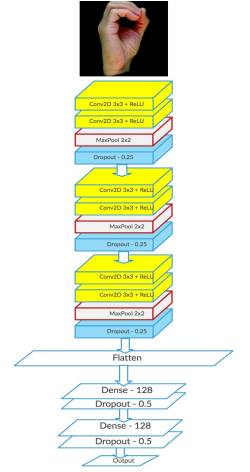

In [111]:
############################
# Coded by Ng Jan Hui
############################

class ShallowNet(nn.Module):
  def __init__(self, in_channels=3, num_classes=29):
    super(ShallowNet, self).__init__()
    
    # Conv Layers
    block_c = [64, 128, 256, 512]
    self.conv_blocks = nn.Sequential()

    # Add to the block module using loop
    self.modules = []
    for i in range(0, 4):
      if i == 0:
        # Use 3 as in_c for first block
        block = self._create_block(in_c=in_channels, out_c=block_c[i])
      else:
        # Use prev out_c
        block = self._create_block(in_c=block_c[i-1], out_c=block_c[i])

      # Append to block module list
      self.modules.append(block)

    # Creating the first few conv layers
    self.conv_blocks = nn.Sequential(*self.modules)

    # Top layers
    # Instead of flatten, use GAP to prevent overfitting (Innovation)
    self.gap = nn.AdaptiveAvgPool2d((1,1))

    # Adding FC Layers
    self.fc1 = nn.Linear(in_features=512, out_features=512)
    self.fc2 = nn.Linear(in_features=512, out_features=1024)

    # Adding classifier
    self.classifier = nn.Linear(in_features=1024, out_features=num_classes)
    
  def forward(self, x):
    x = self.conv_blocks(x)

    # GAP
    x = self.gap(x)
    x = x.view(-1, 512)

    # FC Layers
    x = self.fc1(x)
    x = F.relu(x)
    x = self.fc2(x)
    x = F.relu(x)

    # Classifier
    x = self.classifier(x)

    return x

  # Function for creating the conv blocks
  def _create_block(self, in_c, out_c):
    block = nn.Sequential(
        nn.Conv2d(in_channels=in_c, out_channels=out_c, kernel_size=3),
        nn.ReLU(),
        nn.Conv2d(in_channels=out_c, out_channels=out_c, kernel_size=3),
        nn.ReLU(),
        nn.BatchNorm2d(num_features=out_c),
        nn.MaxPool2d(kernel_size=2),
        nn.Dropout(0.25)
    )

    return block

## 3.5 Grayscale + CustomNet

Concept: https://www.sciencedirect.com/science/article/pii/S2666990021000471

This paper using binary image. However, this loss a lot of information as only a filled contour is maintained

A grayscale image can reduce the model channel. As it already perform a "Filter"

In [7]:
############################
# Code by Tan Jing Jie 
############################

# define convoluntional layer
# same as ShallowNet
def create_block(in_c, out_c):
  block = nn.Sequential(
        nn.Conv2d(in_channels=in_c, out_channels=out_c, kernel_size=3),
        nn.ReLU(),
        nn.Conv2d(in_channels=out_c, out_channels=out_c, kernel_size=3),
        nn.ReLU(),
        nn.BatchNorm2d(num_features=out_c),
        nn.MaxPool2d(kernel_size=2),
        nn.Dropout(0.25)
  )

  return block

class CustomNet(nn.Module):
  def __init__(self):
    super().__init__()
    
    block_c = [1, 64, 128, 256]
    # reduce the layer from 4->3
    self.blocks = nn.ModuleList(
        create_block(in_c=block_c[i], out_c=block_c[i+1]) for i in range(0, 3)
    )

    # global pool
    self.gap = nn.AdaptiveAvgPool2d((1,1))

    # since layer decreased, the number of neuron decreased too 
    # --> less size and light weight model
    self.fc1 = nn.Linear(in_features=256, out_features=256)
    self.fc2 = nn.Linear(in_features=256, out_features=512)
    self.classifier = nn.Linear(in_features=512, out_features=29)
    
  def forward(self, x):

    #convolutional layer
    for b in self.blocks:
      x = b(x)

    # global pool
    x = self.gap(x)
    x = x.view(-1, 256)

    # FC layer
    x = self.fc1(x)
    x = F.relu(x)
    x = self.fc2(x)
    x = F.relu(x)

    # classification
    x = self.classifier(x)

    return x

# Part 4: Model Training

### 4.1 Training Helper Function

In [ ]:
# Evaluation visualisation
from torch.utils.tensorboard import SummaryWriter
writer = SummaryWriter('runs/graph') 

# training function with validation loss tracking
loss_iter = 1

def train(net, num_epochs, trainloader, validationloader, verbose=True, name="Net"):
    history = []
    v_loss_history = []

    loss_iterations = int(np.ceil(len(trainloader) / loss_iter))

    # set the optimizer
    if name == "VGGNet":
        optimizer = optim.SGD(net.parameters(), lr=0.001, momentum=0.9,weight_decay= 10**-6)
    else:
        optimizer = optim.SGD(net.parameters(), lr=0.001, momentum=0.9)

    # transfer model to GPU
    if torch.cuda.is_available():
        net = net.cuda()

    # train the network
    for e in range(num_epochs):

        # Training Step
        running_train_loss = 0.0
        running_count = 0.0
        train_loss = 0

        # set to training mode
        net.train(True)

        # per epoch training activity
        for i, (inputs, labels) in enumerate(trainloader):

            # clear all the gradient to 0
            optimizer.zero_grad()

            # transfer data to GPU
            if torch.cuda.is_available():
                inputs = inputs.cuda()
                labels = labels.cuda()

            # forward propagation
            outs = net(inputs)

            # compute loss
            loss = F.cross_entropy(outs, labels)

            # backpropagation
            loss.backward()

            # update w
            optimizer.step()

            # get the loss
            running_train_loss += loss.item()
            running_count += 1
            train_loss = 0

            # display the averaged loss value
            if i % loss_iterations == loss_iterations - 1 or i == len(trainloader) - 1:
                train_loss = running_train_loss / running_count
                running_train_loss = 0.
                running_count = 0.

                if verbose:
                    print(
                        f'[Epoch {e + 1:2d}/{num_epochs:d} Iter {i + 1:5d}/{len(trainloader)}]: train_loss = {train_loss:.4f}')

                history.append(train_loss)

                # Update tensorboard
                writer.add_scalar(name + "/training loss", train_loss, e * len(trainloader) + i)

        # Turn off training mode for reporting validation loss
        running_vloss = 0.0
        net.train(False)

        ############################
        # Coded by Ng Jan Hui, Tan Jing Jie
        ############################

        # per epoch validation activity
        for v_i, (vinputs, vlabels) in enumerate(validationloader):
            
            # transfer data to GPU
            if torch.cuda.is_available():
                vinputs = vinputs.cuda()
                vlabels = vlabels.cuda()

            vout = net(vinputs)
            vloss = F.cross_entropy(vout, vlabels)
            running_vloss += vloss.item()

        avg_vloss = running_vloss / (v_i + 1)

        if verbose:
            print(f'[Epoch {e + 1:2d}/{num_epochs:d}] validation loss = {avg_vloss:.4f}')

        v_loss_history.append(avg_vloss)
        writer.add_scalar(name + "/validation loss", avg_vloss, e * len(trainloader) + i)



### 4.2 Model Instantiation


```
############################
# Coded by Tan Jing Jie, Ng Jan Hui, Sia Ken Yen
############################
```



#### 4.2.1 VGGNet

In [ ]:
vgg_net = vgg_net_build_network(pretrained=True)
summary(vgg_net, (3, 224, 224), device = "cpu")

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 224, 224]           1,792
              ReLU-2         [-1, 64, 224, 224]               0
            Conv2d-3         [-1, 64, 224, 224]          36,928
              ReLU-4         [-1, 64, 224, 224]               0
         MaxPool2d-5         [-1, 64, 112, 112]               0
            Conv2d-6        [-1, 128, 112, 112]          73,856
              ReLU-7        [-1, 128, 112, 112]               0
            Conv2d-8        [-1, 128, 112, 112]         147,584
              ReLU-9        [-1, 128, 112, 112]               0
        MaxPool2d-10          [-1, 128, 56, 56]               0
           Conv2d-11          [-1, 256, 56, 56]         295,168
             ReLU-12          [-1, 256, 56, 56]               0
           Conv2d-13          [-1, 256, 56, 56]         590,080
             ReLU-14          [-1, 256,

#### 4.2.2 ResNet

In [ ]:
res_net = res_net_build_network(pretrained=True)
summary(res_net, (3, 224, 224), device = "cpu")
#for name, param in resnet18.named_parameters():
#     print(name,':', param.requires_grad)

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 112, 112]           9,408
       BatchNorm2d-2         [-1, 64, 112, 112]             128
              ReLU-3         [-1, 64, 112, 112]               0
         MaxPool2d-4           [-1, 64, 56, 56]               0
            Conv2d-5           [-1, 64, 56, 56]          36,864
       BatchNorm2d-6           [-1, 64, 56, 56]             128
              ReLU-7           [-1, 64, 56, 56]               0
            Conv2d-8           [-1, 64, 56, 56]          36,864
       BatchNorm2d-9           [-1, 64, 56, 56]             128
             ReLU-10           [-1, 64, 56, 56]               0
       BasicBlock-11           [-1, 64, 56, 56]               0
           Conv2d-12           [-1, 64, 56, 56]          36,864
      BatchNorm2d-13           [-1, 64, 56, 56]             128
             ReLU-14           [-1, 64,

#### 4.2.3 EfficientNet

In [ ]:
efficient_net = build_efficent_net(pretrained=True, num_classes=29)
summary(efficient_net, (3, 224, 224), device = "cpu")

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 32, 112, 112]             864
       BatchNorm2d-2         [-1, 32, 112, 112]              64
              SiLU-3         [-1, 32, 112, 112]               0
            Conv2d-4         [-1, 32, 112, 112]             288
       BatchNorm2d-5         [-1, 32, 112, 112]              64
              SiLU-6         [-1, 32, 112, 112]               0
 AdaptiveAvgPool2d-7             [-1, 32, 1, 1]               0
            Conv2d-8              [-1, 8, 1, 1]             264
              SiLU-9              [-1, 8, 1, 1]               0
           Conv2d-10             [-1, 32, 1, 1]             288
          Sigmoid-11             [-1, 32, 1, 1]               0
SqueezeExcitation-12         [-1, 32, 112, 112]               0
           Conv2d-13         [-1, 16, 112, 112]             512
      BatchNorm2d-14         [-1, 16, 1

#### 4.2.4 ShallowNet

In [ ]:
shallow_net = ShallowNet()
summary(shallow_net, (3, 224, 224), device='cpu')

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 222, 222]           1,792
              ReLU-2         [-1, 64, 222, 222]               0
            Conv2d-3         [-1, 64, 220, 220]          36,928
              ReLU-4         [-1, 64, 220, 220]               0
       BatchNorm2d-5         [-1, 64, 220, 220]             128
         MaxPool2d-6         [-1, 64, 110, 110]               0
           Dropout-7         [-1, 64, 110, 110]               0
            Conv2d-8        [-1, 128, 108, 108]          73,856
              ReLU-9        [-1, 128, 108, 108]               0
           Conv2d-10        [-1, 128, 106, 106]         147,584
             ReLU-11        [-1, 128, 106, 106]               0
      BatchNorm2d-12        [-1, 128, 106, 106]             256
        MaxPool2d-13          [-1, 128, 53, 53]               0
          Dropout-14          [-1, 128,

#### 4.2.5 Grayscale + CustomNet


In [ ]:
custom_net = CustomNet()
summary(custom_net, ( 1,224,224), device = "cpu")

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 222, 222]             640
              ReLU-2         [-1, 64, 222, 222]               0
            Conv2d-3         [-1, 64, 220, 220]          36,928
              ReLU-4         [-1, 64, 220, 220]               0
       BatchNorm2d-5         [-1, 64, 220, 220]             128
         MaxPool2d-6         [-1, 64, 110, 110]               0
           Dropout-7         [-1, 64, 110, 110]               0
            Conv2d-8        [-1, 128, 108, 108]          73,856
              ReLU-9        [-1, 128, 108, 108]               0
           Conv2d-10        [-1, 128, 106, 106]         147,584
             ReLU-11        [-1, 128, 106, 106]               0
      BatchNorm2d-12        [-1, 128, 106, 106]             256
        MaxPool2d-13          [-1, 128, 53, 53]               0
          Dropout-14          [-1, 128,

### 4.3 Model Training


```
############################
# Coded by Tan Jing Jie, Ng Jan Hui, Sia Ken Yen
############################
```



#### 4.3.1 VGGNet

In [ ]:
train(vgg_net,num_epochs = 30, trainloader = trainloader,validationloader=validationloader, verbose =1,name='VGGNet')

[Epoch  1/30 Iter   182/182]: train_loss = 2.6368
[Epoch  1/30] validation loss = 1.9109
[Epoch  2/30 Iter   182/182]: train_loss = 1.7396
[Epoch  2/30] validation loss = 1.4198
[Epoch  3/30 Iter   182/182]: train_loss = 1.4189
[Epoch  3/30] validation loss = 1.1639
[Epoch  4/30 Iter   182/182]: train_loss = 1.2297
[Epoch  4/30] validation loss = 1.0205
[Epoch  5/30 Iter   182/182]: train_loss = 1.1455
[Epoch  5/30] validation loss = 0.9243
[Epoch  6/30 Iter   182/182]: train_loss = 1.0512
[Epoch  6/30] validation loss = 0.8628
[Epoch  7/30 Iter   182/182]: train_loss = 1.0053
[Epoch  7/30] validation loss = 0.8089
[Epoch  8/30 Iter   182/182]: train_loss = 0.9400
[Epoch  8/30] validation loss = 0.7413
[Epoch  9/30 Iter   182/182]: train_loss = 0.9112
[Epoch  9/30] validation loss = 0.7298
[Epoch 10/30 Iter   182/182]: train_loss = 0.8763
[Epoch 10/30] validation loss = 0.6798
[Epoch 11/30 Iter   182/182]: train_loss = 0.8470
[Epoch 11/30] validation loss = 0.6559
[Epoch 12/30 Iter   1

#### 4.3.2 ResNet

In [ ]:
train(res_net, num_epochs = 30, trainloader = trainloader,  validationloader=validationloader, verbose =1,name='ResNet')

[Epoch  1/30 Iter   182/182]: train_loss = 3.0214
[Epoch  1/30] validation loss = 2.3154
[Epoch  2/30 Iter   182/182]: train_loss = 1.6274
[Epoch  2/30] validation loss = 0.8184
[Epoch  3/30 Iter   182/182]: train_loss = 0.6704
[Epoch  3/30] validation loss = 0.3342
[Epoch  4/30 Iter   182/182]: train_loss = 0.3225
[Epoch  4/30] validation loss = 0.1752
[Epoch  5/30 Iter   182/182]: train_loss = 0.1954
[Epoch  5/30] validation loss = 0.1208
[Epoch  6/30 Iter   182/182]: train_loss = 0.1259
[Epoch  6/30] validation loss = 0.0921
[Epoch  7/30 Iter   182/182]: train_loss = 0.0804
[Epoch  7/30] validation loss = 0.0790
[Epoch  8/30 Iter   182/182]: train_loss = 0.0635
[Epoch  8/30] validation loss = 0.0656
[Epoch  9/30 Iter   182/182]: train_loss = 0.0430
[Epoch  9/30] validation loss = 0.0638
[Epoch 10/30 Iter   182/182]: train_loss = 0.0398
[Epoch 10/30] validation loss = 0.0477
[Epoch 11/30 Iter   182/182]: train_loss = 0.0338
[Epoch 11/30] validation loss = 0.0507
[Epoch 12/30 Iter   1

#### 4.3.3 EfficientNet

In [ ]:
train(efficient_net, num_epochs=30, trainloader=trainloader, validationloader=validationloader, verbose=1, name='EfficientNet')

[Epoch  1/30 Iter   182/182]: train_loss = 3.2734
[Epoch  1/30] validation loss = 3.1098
[Epoch  2/30 Iter   182/182]: train_loss = 3.0189
[Epoch  2/30] validation loss = 2.8228
[Epoch  3/30 Iter   182/182]: train_loss = 2.7387
[Epoch  3/30] validation loss = 2.4962
[Epoch  4/30 Iter   182/182]: train_loss = 2.4236
[Epoch  4/30] validation loss = 2.1709
[Epoch  5/30 Iter   182/182]: train_loss = 2.1130
[Epoch  5/30] validation loss = 1.8361
[Epoch  6/30 Iter   182/182]: train_loss = 1.8423
[Epoch  6/30] validation loss = 1.5660
[Epoch  7/30 Iter   182/182]: train_loss = 1.6173
[Epoch  7/30] validation loss = 1.4063
[Epoch  8/30 Iter   182/182]: train_loss = 1.4373
[Epoch  8/30] validation loss = 1.2013
[Epoch  9/30 Iter   182/182]: train_loss = 1.3021
[Epoch  9/30] validation loss = 1.1233
[Epoch 10/30 Iter   182/182]: train_loss = 1.1865
[Epoch 10/30] validation loss = 0.9970
[Epoch 11/30 Iter   182/182]: train_loss = 1.0749
[Epoch 11/30] validation loss = 0.9449
[Epoch 12/30 Iter   1

#### 4.3.4 ShallowNet

In [ ]:
 train(shallow_net, num_epochs=30, trainloader=trainloader, validationloader=validationloader,  verbose=1, name='ShallowNet')

[Epoch  1/30 Iter   182/182]: train_loss = 3.2967
[Epoch  1/30] validation loss = 3.2743
[Epoch  2/30 Iter   182/182]: train_loss = 3.0244
[Epoch  2/30] validation loss = 3.1489
[Epoch  3/30 Iter   182/182]: train_loss = 2.7617
[Epoch  3/30] validation loss = 2.9549
[Epoch  4/30 Iter   182/182]: train_loss = 2.4524
[Epoch  4/30] validation loss = 2.4737
[Epoch  5/30 Iter   182/182]: train_loss = 2.0619
[Epoch  5/30] validation loss = 2.0416
[Epoch  6/30 Iter   182/182]: train_loss = 1.7099
[Epoch  6/30] validation loss = 1.8770
[Epoch  7/30 Iter   182/182]: train_loss = 1.4883
[Epoch  7/30] validation loss = 1.4935
[Epoch  8/30 Iter   182/182]: train_loss = 1.2397
[Epoch  8/30] validation loss = 1.2900
[Epoch  9/30 Iter   182/182]: train_loss = 1.0775
[Epoch  9/30] validation loss = 1.0209
[Epoch 10/30 Iter   182/182]: train_loss = 0.9086
[Epoch 10/30] validation loss = 1.0166
[Epoch 11/30 Iter   182/182]: train_loss = 0.7712
[Epoch 11/30] validation loss = 0.8459
[Epoch 12/30 Iter   1

#### 4.3.5 Grayscale + CustomNet

In [ ]:
train(custom_net, num_epochs=1, trainloader=trainloader2, validationloader=validationloader2, verbose=1, name='CustomNet')

**First 40**

```
[Epoch  1/40 Iter   182/182]: train_loss = 3.3508
[Epoch  1/40] validation loss = 3.3586
[Epoch  2/40 Iter   182/182]: train_loss = 3.2985
[Epoch  2/40] validation loss = 3.3357
[Epoch  3/40 Iter   182/182]: train_loss = 3.2156
[Epoch  3/40] validation loss = 3.2741
[Epoch  4/40 Iter   182/182]: train_loss = 3.1051
[Epoch  4/40] validation loss = 3.2557
[Epoch  5/40 Iter   182/182]: train_loss = 2.9871
[Epoch  5/40] validation loss = 3.0814
[Epoch  6/40 Iter   182/182]: train_loss = 2.8196
[Epoch  6/40] validation loss = 2.9212
[Epoch  7/40 Iter   182/182]: train_loss = 2.6347
[Epoch  7/40] validation loss = 2.7642
[Epoch  8/40 Iter   182/182]: train_loss = 2.4747
[Epoch  8/40] validation loss = 2.5634
[Epoch  9/40 Iter   182/182]: train_loss = 2.3094
[Epoch  9/40] validation loss = 2.5611
[Epoch 10/40 Iter   182/182]: train_loss = 2.1899
[Epoch 10/40] validation loss = 2.3154
[Epoch 11/40 Iter   182/182]: train_loss = 2.0371
[Epoch 11/40] validation loss = 2.2443
[Epoch 12/40 Iter   182/182]: train_loss = 1.8838
[Epoch 12/40] validation loss = 1.8538
[Epoch 13/40 Iter   182/182]: train_loss = 1.7533
[Epoch 13/40] validation loss = 1.6496
[Epoch 14/40 Iter   182/182]: train_loss = 1.6247
[Epoch 14/40] validation loss = 1.5032
[Epoch 15/40 Iter   182/182]: train_loss = 1.5298
[Epoch 15/40] validation loss = 1.3379
[Epoch 16/40 Iter   182/182]: train_loss = 1.4013
[Epoch 16/40] validation loss = 1.1253
[Epoch 17/40 Iter   182/182]: train_loss = 1.3026
[Epoch 17/40] validation loss = 1.0363
[Epoch 18/40 Iter   182/182]: train_loss = 1.2020
[Epoch 18/40] validation loss = 1.1060
[Epoch 19/40 Iter   182/182]: train_loss = 1.0814
[Epoch 19/40] validation loss = 1.1611
[Epoch 20/40 Iter   182/182]: train_loss = 1.0271
[Epoch 20/40] validation loss = 0.8981
[Epoch 21/40 Iter   182/182]: train_loss = 0.8963
[Epoch 21/40] validation loss = 0.7212
[Epoch 22/40 Iter   182/182]: train_loss = 0.8405
[Epoch 22/40] validation loss = 1.0357
[Epoch 23/40 Iter   182/182]: train_loss = 0.7503
[Epoch 23/40] validation loss = 0.7054
[Epoch 24/40 Iter   182/182]: train_loss = 0.6912
[Epoch 24/40] validation loss = 0.7511
[Epoch 25/40 Iter   182/182]: train_loss = 0.6533
[Epoch 25/40] validation loss = 0.6772
[Epoch 26/40 Iter   182/182]: train_loss = 0.5875
[Epoch 26/40] validation loss = 0.5639
[Epoch 27/40 Iter   182/182]: train_loss = 0.5590
[Epoch 27/40] validation loss = 0.8580
[Epoch 28/40 Iter   182/182]: train_loss = 0.4965
[Epoch 28/40] validation loss = 0.5362
[Epoch 29/40 Iter   182/182]: train_loss = 0.4751
[Epoch 29/40] validation loss = 0.6336
[Epoch 30/40 Iter   182/182]: train_loss = 0.4391
[Epoch 30/40] validation loss = 0.4823
[Epoch 31/40 Iter   182/182]: train_loss = 0.4403
[Epoch 31/40] validation loss = 0.5064
[Epoch 32/40 Iter   182/182]: train_loss = 0.3564
[Epoch 32/40] validation loss = 0.3466
[Epoch 33/40 Iter   182/182]: train_loss = 0.3560
[Epoch 33/40] validation loss = 0.3991
[Epoch 34/40 Iter   182/182]: train_loss = 0.3192
[Epoch 34/40] validation loss = 0.3000
[Epoch 35/40 Iter   182/182]: train_loss = 0.2783
[Epoch 35/40] validation loss = 0.4150
[Epoch 36/40 Iter   182/182]: train_loss = 0.2627
[Epoch 36/40] validation loss = 0.2759
[Epoch 37/40 Iter   182/182]: train_loss = 0.3051
[Epoch 37/40] validation loss = 0.5879
[Epoch 38/40 Iter   182/182]: train_loss = 0.2366
[Epoch 38/40] validation loss = 0.2743
[Epoch 39/40 Iter   182/182]: train_loss = 0.1981
[Epoch 39/40] validation loss = 0.2502
[Epoch 40/40 Iter   182/182]: train_loss = 0.1857
[Epoch 40/40] validation loss = 0.3051
```

**Next 30**
```
[Epoch  1/30 Iter   182/182]: train_loss = 0.2039
[Epoch  1/30] validation loss = 0.3313
[Epoch  2/30 Iter   182/182]: train_loss = 0.1759
[Epoch  2/30] validation loss = 0.2650
[Epoch  3/30 Iter   182/182]: train_loss = 0.1937
[Epoch  3/30] validation loss = 0.1872
[Epoch  4/30 Iter   182/182]: train_loss = 0.1579
[Epoch  4/30] validation loss = 0.2467
[Epoch  5/30 Iter   182/182]: train_loss = 0.1423
[Epoch  5/30] validation loss = 0.3476
[Epoch  6/30 Iter   182/182]: train_loss = 0.1397
[Epoch  6/30] validation loss = 0.1424
[Epoch  7/30 Iter   182/182]: train_loss = 0.1101
[Epoch  7/30] validation loss = 0.1353
[Epoch  8/30 Iter   182/182]: train_loss = 0.1252
[Epoch  8/30] validation loss = 0.1858
[Epoch  9/30 Iter   182/182]: train_loss = 0.1367
[Epoch  9/30] validation loss = 0.1384
[Epoch 10/30 Iter   182/182]: train_loss = 0.1467
[Epoch 10/30] validation loss = 0.1723
[Epoch 11/30 Iter   182/182]: train_loss = 0.1006
[Epoch 11/30] validation loss = 0.1573
[Epoch 12/30 Iter   182/182]: train_loss = 0.1031
[Epoch 12/30] validation loss = 0.1031
[Epoch 13/30 Iter   182/182]: train_loss = 0.0800
[Epoch 13/30] validation loss = 0.1244
[Epoch 14/30 Iter   182/182]: train_loss = 0.0716
[Epoch 14/30] validation loss = 0.0753
[Epoch 15/30 Iter   182/182]: train_loss = 0.0747
[Epoch 15/30] validation loss = 0.1007
[Epoch 16/30 Iter   182/182]: train_loss = 0.0660
[Epoch 16/30] validation loss = 0.0776
[Epoch 17/30 Iter   182/182]: train_loss = 0.0553
[Epoch 17/30] validation loss = 0.1637
[Epoch 18/30 Iter   182/182]: train_loss = 0.0678
[Epoch 18/30] validation loss = 0.1100
[Epoch 19/30 Iter   182/182]: train_loss = 0.0537
[Epoch 19/30] validation loss = 0.1439
[Epoch 20/30 Iter   182/182]: train_loss = 0.0513
[Epoch 20/30] validation loss = 0.0954
[Epoch 21/30 Iter   182/182]: train_loss = 0.0442
[Epoch 21/30] validation loss = 0.0869
[Epoch 22/30 Iter   182/182]: train_loss = 0.0734
[Epoch 22/30] validation loss = 0.1151
[Epoch 23/30 Iter   182/182]: train_loss = 0.0629
[Epoch 23/30] validation loss = 0.0839
[Epoch 24/30 Iter   182/182]: train_loss = 0.0545
[Epoch 24/30] validation loss = 0.1205
[Epoch 25/30 Iter   182/182]: train_loss = 0.0392
[Epoch 25/30] validation loss = 0.0699
[Epoch 26/30 Iter   182/182]: train_loss = 0.0523
[Epoch 26/30] validation loss = 0.0808
[Epoch 27/30 Iter   182/182]: train_loss = 0.0325
[Epoch 27/30] validation loss = 0.0701
[Epoch 28/30 Iter   182/182]: train_loss = 0.0259
[Epoch 28/30] validation loss = 0.0788
[Epoch 29/30 Iter   182/182]: train_loss = 0.0516
[Epoch 29/30] validation loss = 0.1257
[Epoch 30/30 Iter   182/182]: train_loss = 0.0331
[Epoch 30/30] validation loss = 0.1171
```

**next 5**
```
[Epoch  1/5 Iter   182/182]: train_loss = 0.0371
[Epoch  1/5] validation loss = 0.0872
[Epoch  2/5 Iter   182/182]: train_loss = 0.0432
[Epoch  2/5] validation loss = 0.1021
[Epoch  3/5 Iter   182/182]: train_loss = 0.0533
[Epoch  3/5] validation loss = 0.0942
[Epoch  4/5 Iter   182/182]: train_loss = 0.0271
[Epoch  4/5] validation loss = 0.0677
[Epoch  5/5 Iter   182/182]: train_loss = 0.0317
[Epoch  5/5] validation loss = 0.0506
```



# Part 5: Model Testing and Evaluation

In test helper function, we implemented analysis function




#### 5.1 Test Helper Function

In [ ]:
def evaluate(net, testloader,name):
    
    # set to evaluation mode
    net.eval() 

    # running_correct
    running_corrects = 0

    # initialize the prediction and labels
    pred_list = torch.zeros(0, device='cpu')
    label_list = torch.zeros(0, device='cpu')

    # repeat for all batch data in the test set
    for inputs, targets in testloader:

        # transfer to the GPU
        inputs = inputs.to('cuda')
        targets = targets.to('cuda')

        # # disable gradient computation
        with torch.no_grad():
            
            # perform inference
            outputs = net(inputs)

            # predict as the best result  
            _, predicted = torch.max(outputs, 1)

            # accumulate the total correct predictions (For Accuracy)
            running_corrects += (targets == predicted).double().sum()

            ############################
            # Coded by Ng Jan Hui
            ############################
            # Append batch prediction results for other metrics
            pred_list = torch.cat([pred_list, predicted.view(-1).cpu()])
            label_list = torch.cat([label_list, targets.view(-1).cpu()])

    ############################
    # Coded by Ng Jan Hui, Tan Jing Jie
    ############################
    # Print the classification metrics
    print('Accuracy = {:.2f}%'.format(100*running_corrects/len(testloader.dataset)))

    # Classification Report
    print('\n', classification_report(pred_list.numpy(), label_list.numpy(), target_names=(data2.classes if name =='CustomNet' else data.classes)))
    
    # Plot Confusion Matrix
    cm = confusion_matrix(pred_list.numpy(), label_list.numpy())
    cmd = ConfusionMatrixDisplay(cm, display_labels=(data2.classes if name =='CustomNet' else data.classes))
    fig, ax = plt.subplots(figsize=(50,10))
    cmd.plot(ax=ax)

## 5.2 Model Testing


```
############################
# Coded by Tan Jing Jie, Ng Jan Hui, Sia Ken Yen
############################
```



### 5.2.1 VGGNet

In [ ]:
evaluate(vgg_net, testloader,name='VGGNet')

```
Accuracy = 85.64%

               precision    recall  f1-score   support

           A       0.69      1.00      0.82         9
           B       1.00      0.93      0.97        15
           C       1.00      0.88      0.93        16
           D       0.92      1.00      0.96        11
           E       0.86      0.75      0.80        16
           F       1.00      1.00      1.00        10
           G       0.73      0.80      0.76        10
           H       1.00      0.67      0.80        12
           I       0.89      0.89      0.89        18
           J       0.82      1.00      0.90         9
           K       1.00      0.81      0.89        21
           L       0.67      1.00      0.80         8
           M       0.64      1.00      0.78         7
           N       1.00      0.73      0.85        15
           O       0.81      1.00      0.90        13
           P       0.86      1.00      0.92         6
           Q       1.00      1.00      1.00        11
           R       1.00      1.00      1.00        10
           S       1.00      0.58      0.74        12
           T       0.58      0.58      0.58        12
           U       0.71      0.94      0.81        16
           V       0.67      0.80      0.73        10
           W       0.80      0.86      0.83        14
           X       0.75      0.50      0.60        12
           Y       0.81      1.00      0.90        13
           Z       0.87      0.76      0.81        17
         del       1.00      1.00      1.00        12
     nothing       1.00      0.90      0.95        10
       space       0.93      0.82      0.87        17

    accuracy                           0.86       362
   macro avg       0.86      0.87      0.85       362
weighted avg       0.87      0.86      0.86       362
```
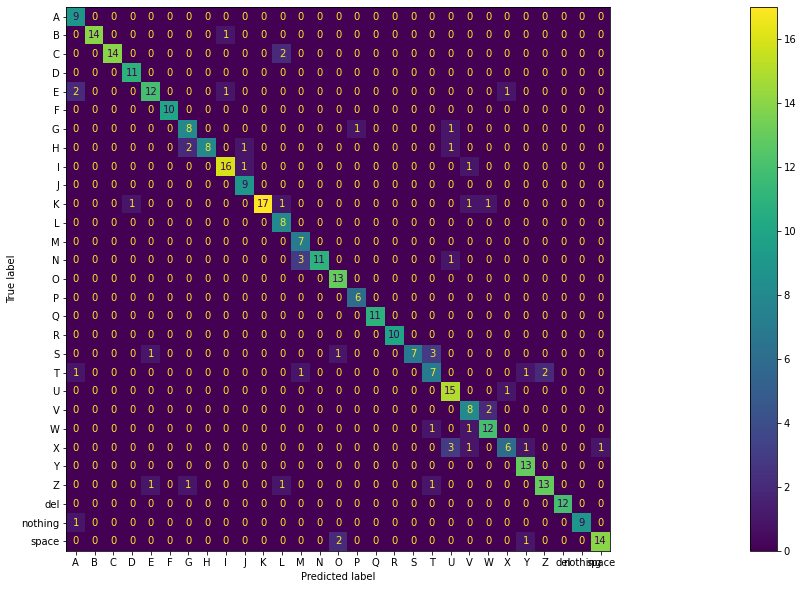

### 5.2.2 ResNet

In [ ]:
evaluate(res_net, testloader, name='ResNet')



```
Accuracy = 99.17%

               precision    recall  f1-score   support

           A       1.00      1.00      1.00        13
           B       1.00      1.00      1.00        14
           C       1.00      1.00      1.00        14
           D       1.00      1.00      1.00        12
           E       1.00      1.00      1.00        14
           F       1.00      1.00      1.00        10
           G       1.00      1.00      1.00        11
           H       1.00      1.00      1.00         8
           I       0.94      1.00      0.97        17
           J       1.00      1.00      1.00        11
           K       1.00      1.00      1.00        17
           L       1.00      1.00      1.00        12
           M       1.00      1.00      1.00        11
           N       1.00      1.00      1.00        11
           O       1.00      1.00      1.00        16
           P       0.86      1.00      0.92         6
           Q       1.00      1.00      1.00        11
           R       1.00      1.00      1.00        10
           S       1.00      0.88      0.93         8
           T       1.00      1.00      1.00        12
           U       1.00      1.00      1.00        21
           V       1.00      0.92      0.96        13
           W       0.93      1.00      0.97        14
           X       1.00      1.00      1.00         8
           Y       1.00      1.00      1.00        16
           Z       1.00      1.00      1.00        15
         del       1.00      1.00      1.00        12
     nothing       1.00      1.00      1.00         9
       space       1.00      0.94      0.97        16

    accuracy                           0.99       362
   macro avg       0.99      0.99      0.99       362
weighted avg       0.99      0.99      0.99       362

```
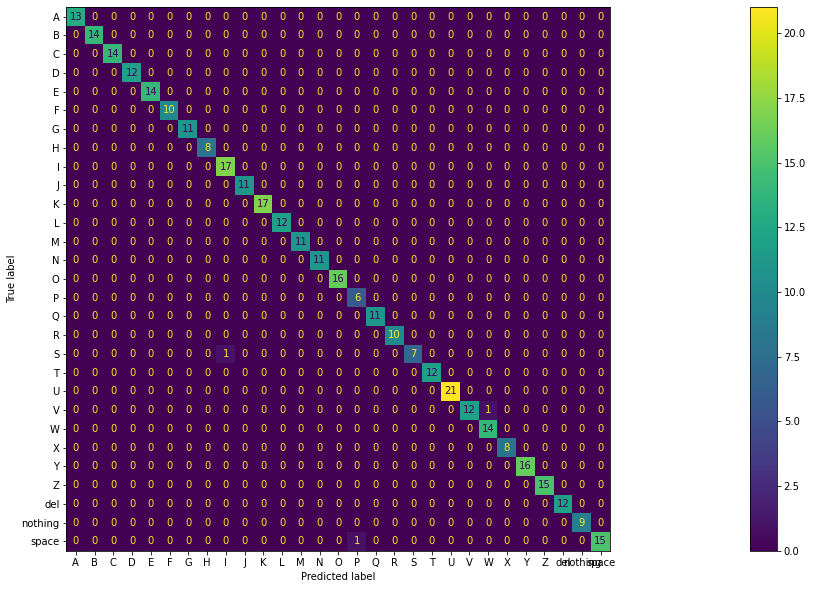



### 5.2.3 EfficientNet

Accuracy = 93.09%

               precision    recall  f1-score   support

           A       0.87      0.87      0.87        15
           B       1.00      1.00      1.00         8
           C       1.00      1.00      1.00        18
           D       1.00      1.00      1.00        14
           E       1.00      0.75      0.86         8
           F       1.00      1.00      1.00        12
           G       1.00      0.92      0.96        12
           H       1.00      1.00      1.00        14
           I       0.88      0.88      0.88         8
           J       1.00      0.90      0.95        10
           K       0.89      0.89      0.89         9
           L       0.93      1.00      0.96        13
           M       1.00      1.00      1.00        10
           N       1.00      1.00      1.00         7
           O       1.00      1.00      1.00        10
           P       1.00      1.00      1.00        12
           Q       1.00      1.00      1.00        13
       

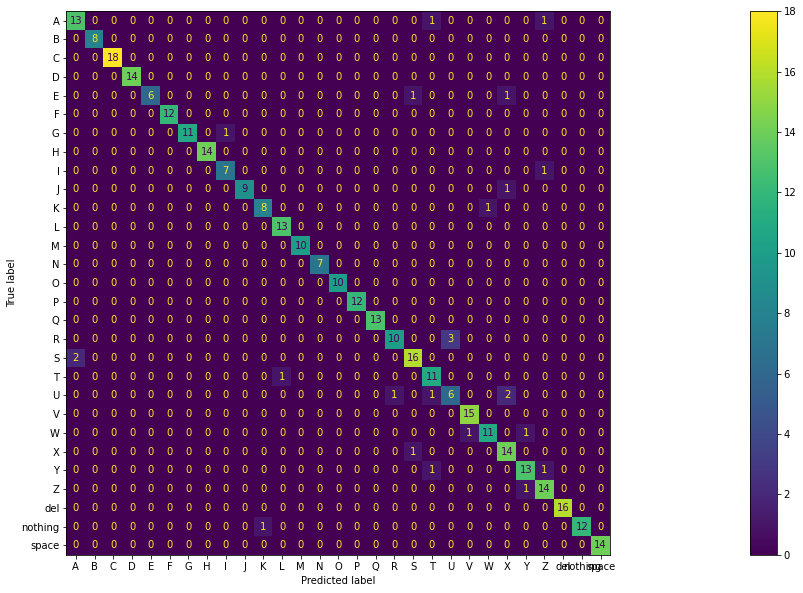

In [ ]:
evaluate(efficient_net, testloader, name='EfficientNet')

### 5.2.4 ShallowNet

In [ ]:
evaluate(shallow_net, testloader, name='ShallowNet')



```
Accuracy = 99.17%

               precision    recall  f1-score   support

           A       1.00      1.00      1.00        12
           B       1.00      1.00      1.00        14
           C       1.00      1.00      1.00         8
           D       1.00      1.00      1.00        13
           E       1.00      1.00      1.00        10
           F       1.00      1.00      1.00        10
           G       1.00      1.00      1.00         7
           H       1.00      1.00      1.00        17
           I       1.00      1.00      1.00        16
           J       1.00      1.00      1.00        13
           K       1.00      1.00      1.00        12
           L       1.00      1.00      1.00        11
           M       1.00      0.93      0.96        14
           N       0.92      1.00      0.96        12
           O       0.93      1.00      0.96        13
           P       1.00      1.00      1.00        10
           Q       1.00      0.94      0.97        18
           R       1.00      0.92      0.96        13
           S       1.00      1.00      1.00        12
           T       1.00      1.00      1.00         8
           U       0.92      1.00      0.96        11
           V       1.00      1.00      1.00        13
           W       1.00      1.00      1.00        12
           X       1.00      1.00      1.00        10
           Y       1.00      1.00      1.00        16
           Z       1.00      1.00      1.00        17
         del       1.00      1.00      1.00        15
     nothing       1.00      1.00      1.00        16
       space       1.00      1.00      1.00         9

    accuracy                           0.99       362
   macro avg       0.99      0.99      0.99       362
weighted avg       0.99      0.99      0.99       362
```


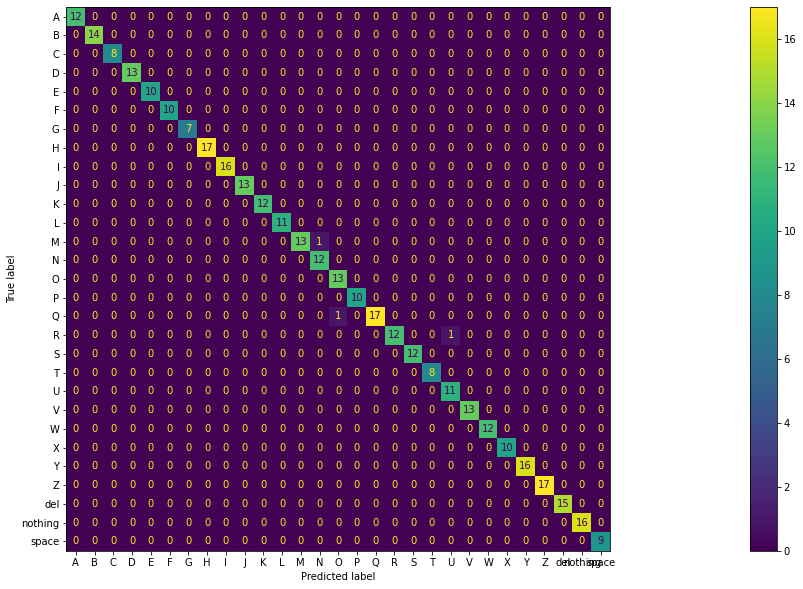

### 5.2.5 Grayscale + CustomNet

In [ ]:
evaluate(custom_net, testloader2, name='CustomNet')

**Epoch = 40**
```
Accuracy = 89.50%

               precision    recall  f1-score   support

           A       1.00      0.77      0.87        13
           B       1.00      1.00      1.00        12
           C       0.80      1.00      0.89        12
           D       1.00      1.00      1.00         8
           E       0.75      1.00      0.86         9
           F       1.00      0.90      0.95        10
           G       1.00      1.00      1.00        11
           H       1.00      0.93      0.96        14
           I       0.80      1.00      0.89        12
           J       1.00      0.94      0.97        16
           K       0.93      0.88      0.90        16
           L       1.00      0.83      0.91        18
           M       1.00      0.93      0.96        14
           N       0.90      1.00      0.95         9
           O       1.00      1.00      1.00        15
           P       0.83      1.00      0.91        15
           Q       0.75      1.00      0.86         6
           R       0.87      0.87      0.87        15
           S       1.00      1.00      1.00        11
           T       1.00      0.79      0.88        19
           U       0.73      0.92      0.81        12
           V       0.31      0.67      0.42         6
           W       1.00      0.37      0.54        19
           X       1.00      0.93      0.96        14
           Y       0.71      1.00      0.83        10
           Z       0.80      0.89      0.84         9
         del       0.91      0.83      0.87        12
     nothing       1.00      1.00      1.00         9
       space       1.00      0.94      0.97        16

    accuracy                           0.90       362
   macro avg       0.90      0.91      0.89       362
weighted avg       0.92      0.90      0.90       362
```
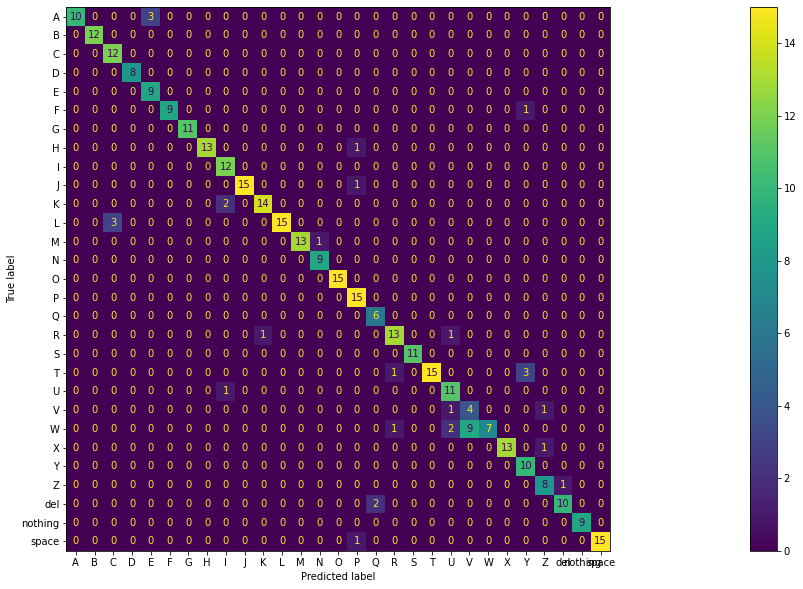

**Epoch = 40+20**
```
Accuracy = 96.41%

               precision    recall  f1-score   support

           A       1.00      0.91      0.95        11
           B       1.00      1.00      1.00        12
           C       1.00      1.00      1.00        15
           D       1.00      1.00      1.00         8
           E       0.92      1.00      0.96        11
           F       1.00      0.90      0.95        10
           G       1.00      1.00      1.00        11
           H       1.00      0.87      0.93        15
           I       1.00      0.94      0.97        16
           J       1.00      1.00      1.00        15
           K       0.93      0.93      0.93        15
           L       1.00      0.94      0.97        16
           M       0.85      1.00      0.92        11
           N       1.00      1.00      1.00        10
           O       1.00      1.00      1.00        15
           P       0.89      0.94      0.91        17
           Q       0.88      1.00      0.93         7
           R       1.00      0.94      0.97        16
           S       1.00      1.00      1.00        11
           T       1.00      1.00      1.00        15
           U       0.93      1.00      0.97        14
           V       0.77      1.00      0.87        10
           W       1.00      0.78      0.88         9
           X       1.00      0.93      0.96        14
           Y       0.93      1.00      0.96        13
           Z       0.90      1.00      0.95         9
         del       1.00      1.00      1.00        11
     nothing       1.00      1.00      1.00         9
       space       1.00      0.94      0.97        16

    accuracy                           0.96       362
   macro avg       0.97      0.97      0.96       362
weighted avg       0.97      0.96      0.96       362

```
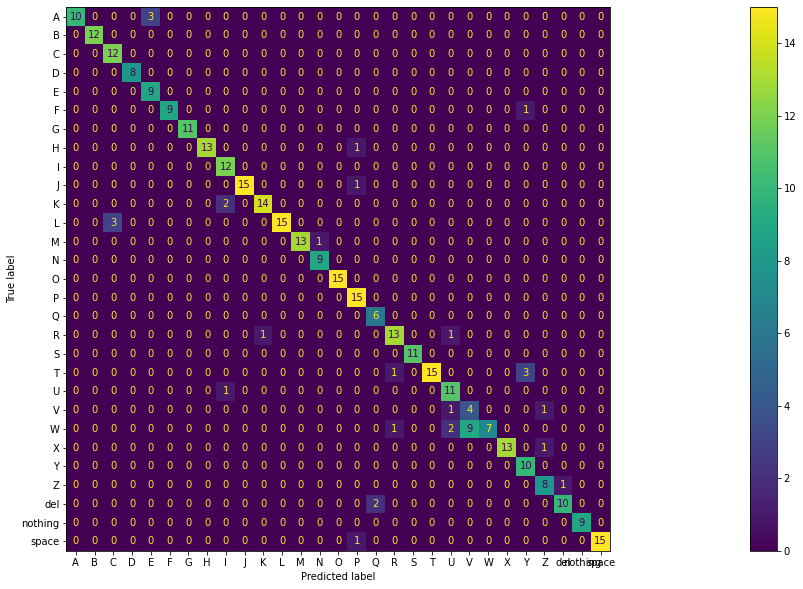

**Epoch 40+20+5**
```
Accuracy = 98.07%

               precision    recall  f1-score   support

           A       1.00      1.00      1.00        10
           B       1.00      1.00      1.00        12
           C       1.00      1.00      1.00        15
           D       1.00      1.00      1.00         8
           E       1.00      1.00      1.00        12
           F       1.00      1.00      1.00         9
           G       1.00      0.92      0.96        12
           H       1.00      0.93      0.96        14
           I       1.00      1.00      1.00        15
           J       1.00      1.00      1.00        15
           K       0.93      1.00      0.97        14
           L       1.00      1.00      1.00        15
           M       0.92      1.00      0.96        12
           N       1.00      0.91      0.95        11
           O       1.00      1.00      1.00        15
           P       0.94      0.94      0.94        18
           Q       0.88      1.00      0.93         7
           R       1.00      1.00      1.00        15
           S       1.00      1.00      1.00        11
           T       1.00      1.00      1.00        15
           U       0.93      1.00      0.97        14
           V       0.92      0.92      0.92        13
           W       1.00      1.00      1.00         7
           X       1.00      0.93      0.96        14
           Y       1.00      1.00      1.00        14
           Z       0.90      1.00      0.95         9
         del       1.00      1.00      1.00        11
     nothing       1.00      1.00      1.00         9
       space       1.00      0.94      0.97        16

    accuracy                           0.98       362
   macro avg       0.98      0.98      0.98       362
weighted avg       0.98      0.98      0.98       362
```
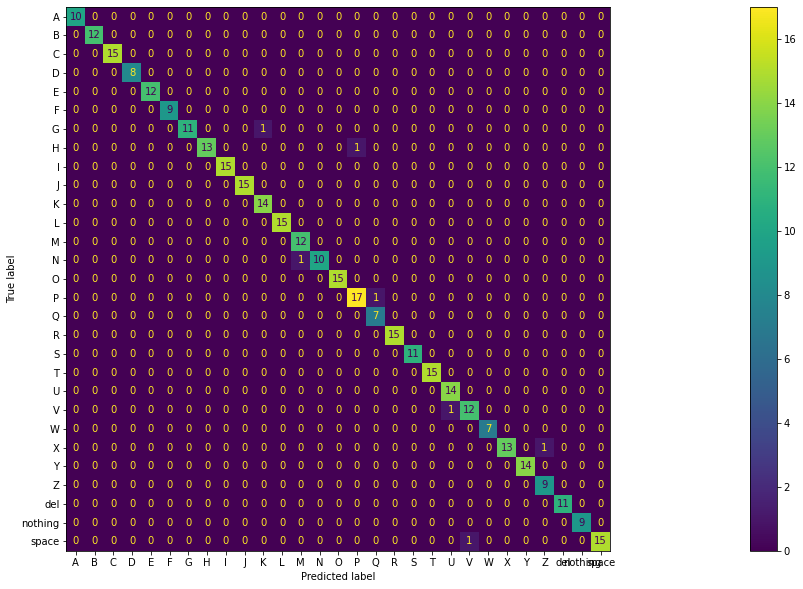

## 5.3 Measuring Inference Time

In [ ]:
############################
# Coded by Tan Jing jie
############################

def measure_inference_time(net,testloader):
  net.eval()
 
  inputs, _ = testloader.dataset[0]
  inputs = inputs.to('cuda')
  inputs = inputs.unsqueeze(0)
  
  with torch.no_grad():
    t1 = time.perf_counter()
    outputs = net(inputs)
    t2 = time.perf_counter()
    
  print('Time taken to execute',t2-t1)

In [ ]:
measure_inference_time(vgg_net, testloader)

Time taken to execute 0.010416793998956564


In [ ]:
measure_inference_time(res_net, testloader)

Time taken to execute 0.009098728000026313


In [ ]:
measure_inference_time(efficient_net, testloader)

Time taken to execute 0.048915798000052746


In [ ]:
measure_inference_time(shallow_net, testloader)

Time taken to execute 0.2807877779996488


In [ ]:
measure_inference_time(custom_net, testloader2)

Time taken to execute 0.006261833000280603


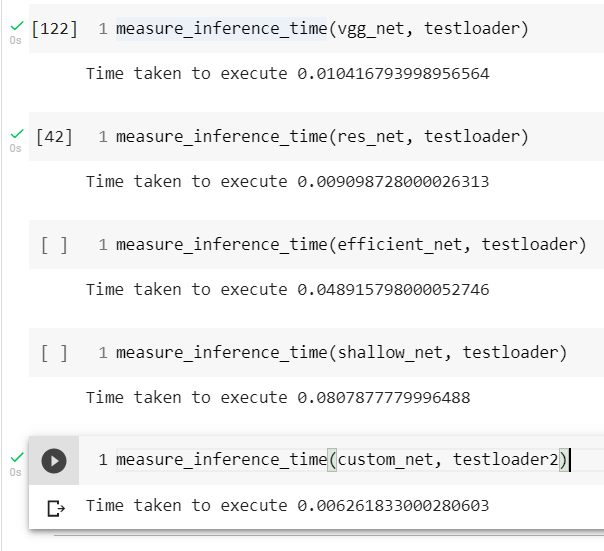

# Part 6: Model Saving


```
############################
# Coded by Tan Jing Jie, Ng Jan Hui, Sia Ken Yen
############################
```



## 6.1 Save

In [ ]:
# Save vgg_net
if not os.path.exists(model_path+"/models"):
    os.mkdir(model_path+"/models")
torch.save(vgg_net, model_path + "/models/vgg_net_saved_model.pt")

In [ ]:
# Save res_net
if not os.path.exists(model_path+"/models"):
    os.mkdir(model_path+"/models")
torch.save(res_net, model_path+"/models/res_net_saved_model.pt")

In [ ]:
# Save efficient_net
if not os.path.exists(model_path+"/models"):
    os.mkdir(model_path+"/models")
torch.save(efficient_net, model_path+"/models/efficient_net_saved_model.pt")

In [ ]:
# Save ShallowNet
if not os.path.exists(model_path+"/models"):
    os.mkdir(model_path+"/models")
torch.save(shallow_net, model_path+"/models/shallow_net_saved_model.pt")

In [ ]:
# Save CustomNet
if not os.path.exists(model_path+"/models"):
    os.mkdir(model_path+"/models")

c = {'model': CustomNet(), 'state_dict': custom_net.state_dict()}
torch.save(c, model_path+"/models/custom_net_saved_model.pt")

## 6.2 Reloading model

In [ ]:
PATH = '/content/drive/MyDrive/Colab Notebooks/models/vgg_net_saved_model.pt'

vgg_net = torch.load(PATH, map_location=lambda storage, loc: storage)
vgg_net.eval()

In [ ]:
PATH = '/content/drive/MyDrive/UCCD3074_Labs/Assignment_2/models/res_net_saved_model.pt'

res_net = torch.load(PATH, map_location=lambda storage, loc: storage)
res_net.eval()

In [ ]:
PATH = '/content/drive/MyDrive/Colab Notebooks/models/eff_net_saved_model.pt'

efficient_net = torch.load(PATH)
efficient_net.eval()

In [ ]:
PATH = '/content/drive/MyDrive/UCCD3074_Labs/Assignment_2/models/ShallowNet_saved_model.pt'

shallow_net = torch.load(PATH, map_location=lambda storage, loc: storage)
shallow_net.eval()

In [ ]:
PATH = '/content/drive/MyDrive/UCCD3074_Labs/Assignment_2/models/custom_net_saved_model.pt'

custom_net = CustomNet()

c = torch.load(PATH, map_location=lambda storage, loc: storage)
custom_net.load_state_dict(c['state_dict'])
custom_net.eval()

# Part 7: Visualisation

## 7.1 Tensorflow Board


```
############################
# Coded by Tan Jing Jie
############################
```



In [ ]:
writer.close() # Close the writter
%load_ext tensorboard
%tensorboard --logdir runs

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

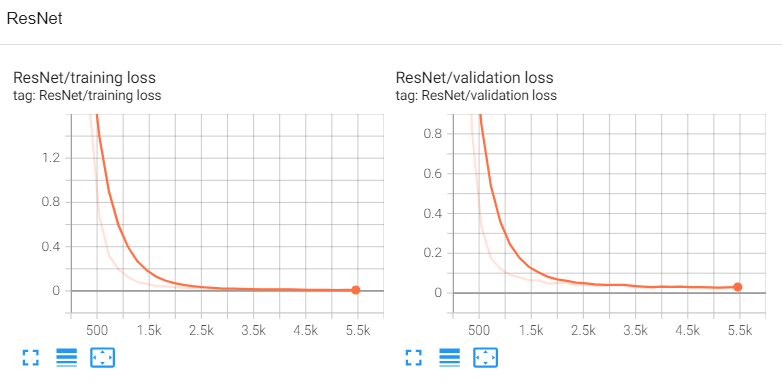

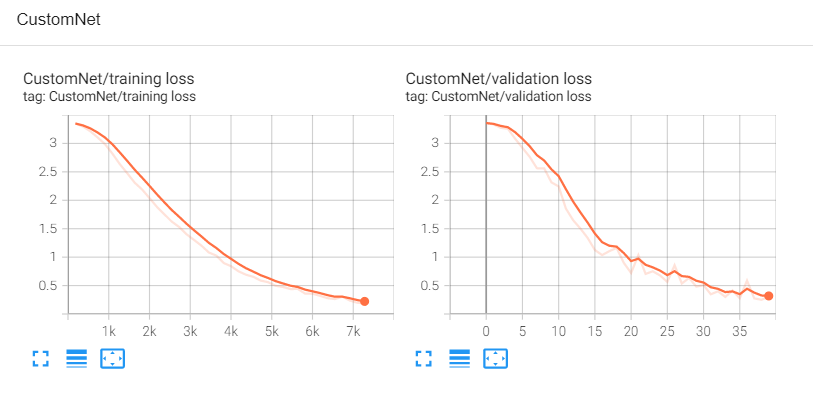

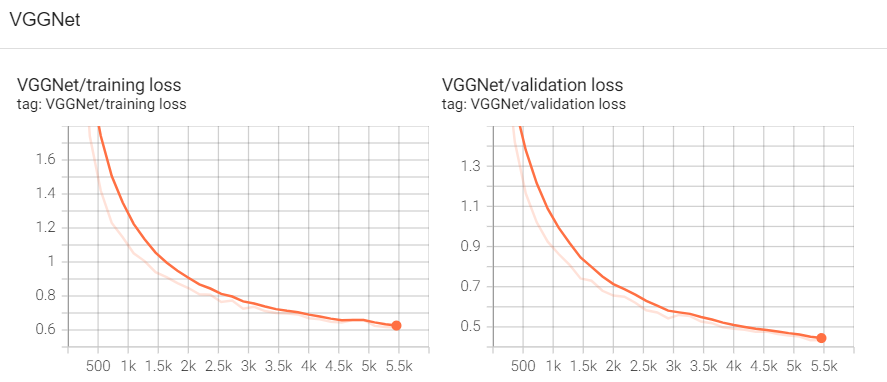

## 7.2 Feature Map

This is to study the convolutional layer if they have learn well.

In [116]:
############################ 
# Adapted from source: https://ravivaishnav20.medium.com/visualizing-feature-maps-using-pytorch-12a48cd1e573
############################
def generate(input_model,image):
  model_weights =[]
  conv_layers = []
  # get all the model children as list
  model_children = list(input_model.children())
  #counter to keep count of the conv layers
  counter = 0
  #append all the conv layers and their respective wights to the list
  for i in range(len(model_children)):
      if type(model_children[i]) == nn.Conv2d:
          counter+=1
          model_weights.append(model_children[i].weight)
          conv_layers.append(model_children[i])
      elif type(model_children[i]) == nn.Sequential or type(model_children[i]) == nn.ModuleList:
          for j in range(len(model_children[i])):
              for child in model_children[i][j].children():
                  if type(child) == nn.Conv2d:
                      counter+=1
                      model_weights.append(child.weight)
                      conv_layers.append(child)
  print(f"Total convolution layers: {counter}")
  outputs = []
  names = []
  for layer in conv_layers[0:]:
      image = layer(image)
      outputs.append(image)
      names.append(str(layer))

  processed = []
  for feature_map in outputs:
      feature_map = feature_map.squeeze(0)
      gray_scale = torch.sum(feature_map,0)
      gray_scale = gray_scale / feature_map.shape[0]
      processed.append(gray_scale.data.cpu().numpy())
  fig = plt.figure(figsize=(30,50 ))

  for i in range(len(processed)):
      a = fig.add_subplot(5, 4, i+1)
      imgplot = plt.imshow(processed[i])
      a.axis("off")
      a.set_title(names[i].split('(')[0], fontsize=30)
  plt.savefig(str('feature_maps.jpg'), bbox_inches='tight')

Total convolution layers: 17


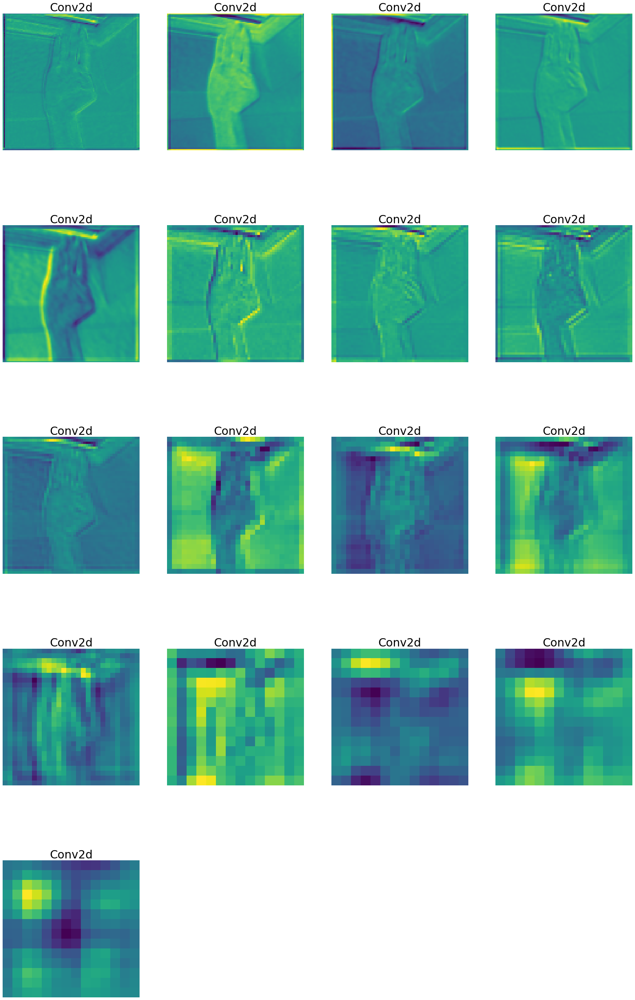

In [120]:
############################
# Coded by Tan Jing Jie
############################
# resnet
image, _ = testloader.dataset[0]
image = image.unsqueeze(0)
generate(res_net,image)

Total convolution layers: 8


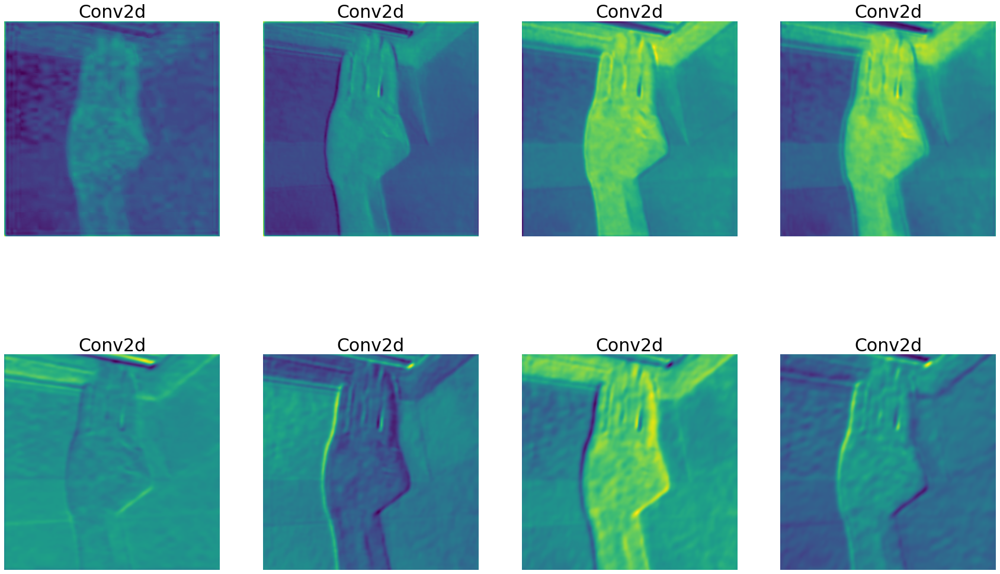

In [117]:
############################
# Coded by Tan Jing Jie
############################
# shallow
image, _ = testloader.dataset[0]
image = image.unsqueeze(0)
generate(shallow_net,image)

torch.Size([1, 1, 224, 224])
Total convolution layers: 6


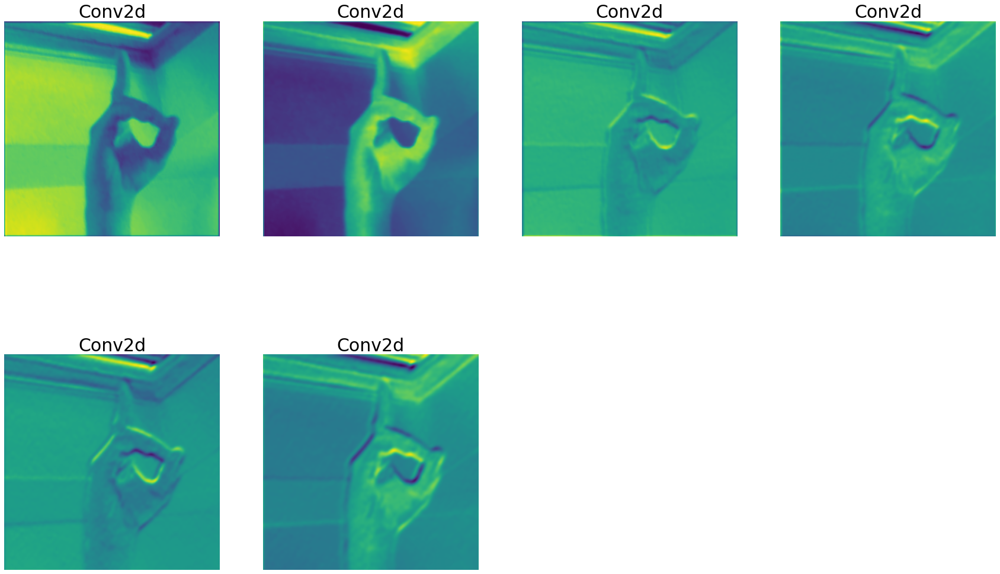

In [119]:
############################
# Coded by Tan Jing Jie
############################
# custom net
image, _ = testloader2.dataset[3]
image = image.unsqueeze(0)
print(image.shape)
generate(custom_net,image)

In [ ]:
def predict_input(net,img):
  net.eval()
 
  image, _ = testloader2.dataset[3]
  tensor_image = image.unsqueeze(0)
  if torch.cuda.is_available():
    inputs = tensor_img.to('cuda')
  else:
    inputs = tensor_img.to('cpu')
  inputs = inputs.unsqueeze(0)
  
  with torch.no_grad():
    outputs = net(inputs)
    outputs = F.softmax(outputs, dim=1)
    
  return outputs

**This verified that the convolutional layer learn well.**

# Part 8: Real-time Simulation

In [ ]:
############################ 
# Source: https://colab.research.google.com/notebooks/snippets/advanced_outputs.ipynb#scrollTo=buJCl90WhNfq
############################
from IPython.display import display, Javascript
from google.colab.output import eval_js
from base64 import b64decode

def take_photo(filename='photo.jpg', quality=0.8):
  js = Javascript('''
    async function takePhoto(quality) {
      const div = document.createElement('div');
      const capture = document.createElement('button');
      capture.textContent = 'Capture';
      div.appendChild(capture);

      const video = document.createElement('video');
      video.style.display = 'block';
      const stream = await navigator.mediaDevices.getUserMedia({video: true});

      document.body.appendChild(div);
      div.appendChild(video);
      video.srcObject = stream;
      await video.play();

      // Resize the output to fit the video element.
      google.colab.output.setIframeHeight(document.documentElement.scrollHeight, true);

      // Wait for Capture to be clicked.
      await new Promise((resolve) => capture.onclick = resolve);

      const canvas = document.createElement('canvas');
      canvas.width = video.videoWidth;
      canvas.height = video.videoHeight;
      canvas.getContext('2d').drawImage(video, 0, 0);
      stream.getVideoTracks()[0].stop();
      div.remove();
      return canvas.toDataURL('image/jpeg', quality);
    }
    ''')
  display(js)
  data = eval_js('takePhoto({})'.format(quality))
  binary = b64decode(data.split(',')[1])
  with open(filename, 'wb') as f:
    f.write(binary)
  return filename

In [ ]:
############################
# Coded by Tan Jing Jie
############################
def predict_input(net,img):
  net.eval()
 
  img = Image.open('photo.jpg')
  tensor_img = data_transform2(img)
  if torch.cuda.is_available():
    inputs = tensor_img.to('cuda')
  else:
    inputs = tensor_img.to('cpu')
  inputs = inputs.unsqueeze(0)
  
  with torch.no_grad():
    outputs = net(inputs)
    outputs = F.softmax(outputs, dim=1)
    
  return outputs

In [ ]:
############################
# Coded by Tan Jing Jie
############################
def capture():
    filename = take_photo()
    
    # Show the image which was just taken.
    img = Image.open(filename)
    display(img)
    array = predict_input(custom_net,img)
    top = torch.topk(array, k=1)
    print("The sign is", data2.classes[top.indices[0]])


<IPython.core.display.Javascript object>

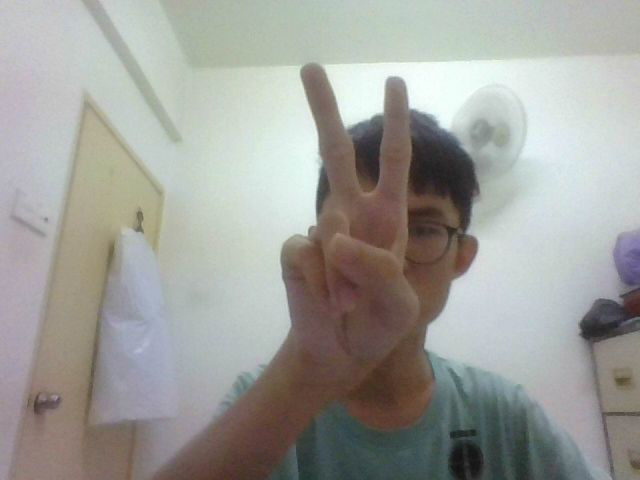

The sign is K


In [ ]:
capture() # Test K

<IPython.core.display.Javascript object>

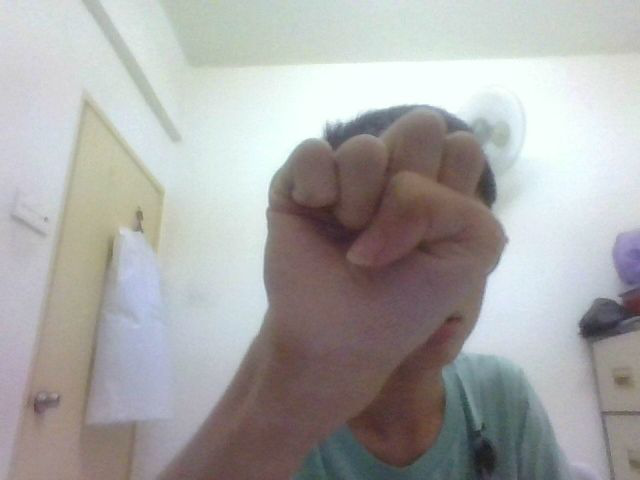

The sign is E


In [ ]:
capture() # Test E

<IPython.core.display.Javascript object>

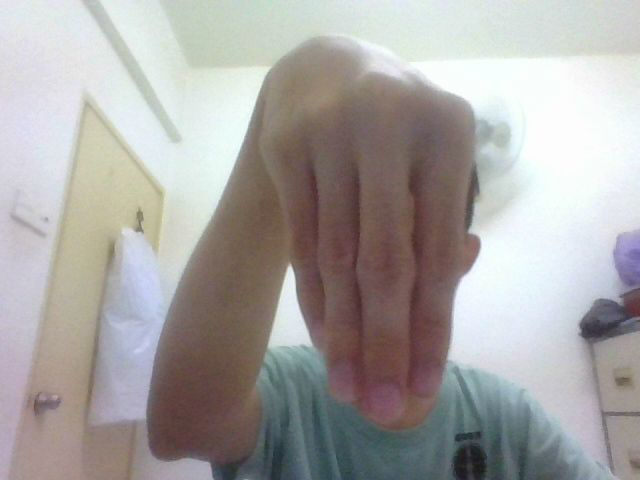

The sign is M


In [ ]:
capture() # Test M

<IPython.core.display.Javascript object>

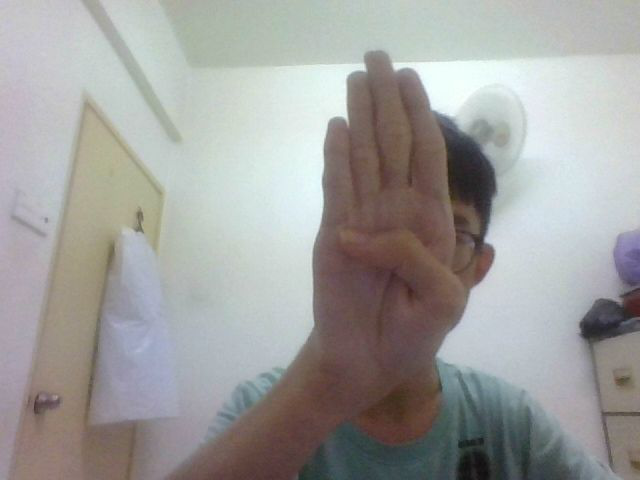

The sign is B


In [ ]:
capture() # Test B

**Sample**

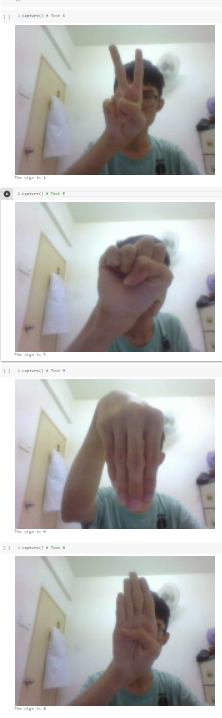

---
End